In [47]:
import pandas as pd
import altair as alt

In [48]:
names = pd.read_csv('dpt2020.csv', sep=';')

In [49]:
names

,sexe,preusuel,annais,dpt,nombre
0,1,_PRENOMS_RARES,1900,02,7
1,1,_PRENOMS_RARES,1900,04,9
2,1,_PRENOMS_RARES,1900,05,8
3,1,_PRENOMS_RARES,1900,06,23
4,1,_PRENOMS_RARES,1900,07,9
...,...,...,...,...,...
3727548,2,ZYA,2018,59,3
3727549,2,ZYA,XXXX,XX,264
3727550,2,ZYNA,2013,93,3
3727551,2,ZYNA,XXXX,XX,59


In [50]:
names.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3727553 entries, 0 to 3727552
Data columns (total 5 columns):
 #   Column    Dtype 
---  ------    ----- 
 0   sexe      int64 
 1   preusuel  object
 2   annais    object
 3   dpt       object
 4   nombre    int64 
dtypes: int64(2), object(3)
memory usage: 142.2+ MB


In [51]:
names.describe()

,sexe,nombre
count,3.727553e+06,3.727553e+06
mean,1.535894e+00,2.323390e+01
std,4.987100e-01,8.047527e+01
min,1.000000e+00,3.000000e+00
25%,1.000000e+00,4.000000e+00
50%,2.000000e+00,7.000000e+00
75%,2.000000e+00,1.900000e+01
max,2.000000e+00,6.310000e+03


In [52]:
names.dpt.value_counts()

dpt
75    127100
59    103867
69     80879
13     79177
62     67952
       ...  
09     15305
05     14928
04     13286
23     12482
48     11099
Name: count, Length: 100, dtype: int64

In [53]:
names.drop(names[names.preusuel == '_PRENOMS_RARES'].index, inplace=True)
names.drop(names[names.dpt == 'XX'].index, inplace=True)

In [54]:
# Convert 'annais' to int
names['annais'] = names['annais'].astype(int)

## Visualization : 3

Are there gender effects in the data? Does popularity of names given to both sexes evolve consistently? (Note: this data set treats sex as binary; this is a simplification that carries into this assignment but does not generally hold.)

## Sketch

This bar chart makes side-by-side comparison between the most popular male and female names each year.

Bars represent the number of babies given the top male (blue) and female (red) names yearly.

This design makes it easy to see how the popularity of names has changed over time for each gender.

This chart is strong in its simplicity, offering a straightforward look at gender-based trends in naming without overwhelming the viewer with too much data.

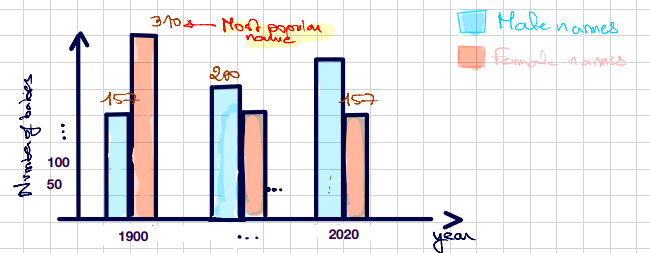

## Implementation

In [55]:
# Group by year, name, and sex, then sum the counts
national_names = names.groupby(['annais', 'preusuel', 'sexe']).nombre.sum().reset_index()

# Separate male and female names
names_males = national_names[national_names.sexe == 1]
names_females = national_names[national_names.sexe == 2]

def most_popular(names):
    # Get the most popular name for each year
    most_popular_names = names.groupby('annais')['nombre'].idxmax()
    return names.loc[most_popular_names]

most_popular_males = most_popular(names_males)
most_popular_females = most_popular(names_females)

# Combine male and female most popular names
most_popular_names = pd.concat([most_popular_females, most_popular_males]).sort_values(['annais', 'sexe'])

In [56]:
# Create the bar chart without faceting
bars = alt.Chart(most_popular_names).mark_bar().encode(
    x=alt.X('annais:O', title='Year', axis=alt.Axis(labelAngle=-90)),
    y=alt.Y('nombre:Q', title='Number of Babies'),
    color=alt.Color('sexe:N', scale=alt.Scale(domain=[1, 2], range=['lightblue', 'lightcoral']),
                    title='Gender'),
    tooltip=['annais','preusuel', 'nombre']
).properties(
    width=1200,
    height=600
)

# # Add text annotations
# text = bars.mark_text(
#     align='center',
#     baseline='bottom',
#     dy=-5  # Adjust the position
# ).encode(
#     text='nombre:Q'
# )

# Combine bar chart and text
final_chart = (bars).properties(
    title='Most Popular Male and Female Names in France Between 1900 and 2020'
)

final_chart

c:\Users\ahmed\anaconda3\envs\visualization\lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

### Answering the questions:
**Q1 :** Are there gender effects in the data? 

=> Yes, it appears that there are gender effects in the data: in fact, we notice that for each year, the most popular male names is more frequent than the most popular female name.

**Q2 :** Does popularity of names given to both sexes evolve consistently?

=> Yes, almost, from the year 1900 until the late 50s, the most popular male names was generally 'JEAN' and the most popular female name was 'MARIE', after that, the names trends seem to rapidly change, but in general, they evolve queite consistently.

**Other observations from the chart :** 

=> We notice that there is a drop in the frequency of the most popular male name for both gender between 1915 and 1919, this can be a cue that the Birth rate decreased during these years. This hypotheis can be considered true especially because we all know that WWI happend between 1914 and 1918.

=> Interestingly, we note that the frequency of the most popular name for both genders for each year is decreased gradually after 1965. This observation can lead to both hypotheses:

* From the year 1965 until now, there is a high variance of names that can be considered as popular, in a manner that there is no longer a 'dominant' name, this can be explained maybe by the fact that France started to be influenced by some other cultures due to globalisation and some other social circumstances.
* From the year 1965 onwards, there is a drop in the birth rates globally in France.

In [57]:
# Filter the data for the years 1990 to 2020
names['annais'] = pd.to_numeric(names['annais'], errors='coerce')
names = names[names['annais'].between(1990, 2020)]


# Group the data by year and gender, summing the occurrences
grouped_names = names.groupby(['annais', 'sexe']).sum().reset_index()

# Map gender to readable format
grouped_names['sexe'] = grouped_names['sexe'].map({1: 'Male', 2: 'Female'})

# Create the line chart
chart = alt.Chart(grouped_names).mark_line().encode(
    x=alt.X('annais:O', title='Year'),
    y=alt.Y('nombre:Q', title='Number of Babies'),
    color=alt.Color('sexe:N', scale=alt.Scale(domain=['Male', 'Female'], range=['blue', 'pink']), title='Gender'),
    tooltip=['annais:O', 'sexe:N', 'nombre:Q']
).properties(
    title='Popularity of Male and Female Names Over the Years (1990-2020)',
    width=800,
    height=400
).interactive()

chart

c:\Users\ahmed\anaconda3\envs\visualization\lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
c:\Users\ahmed\anaconda3\envs\visualization\lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
c:\Users\ahmed\anaconda3\envs\visualization\lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.Chart(...)

In [58]:
# Convert 'annais' and 'nombre' to numeric
names['annais'] = pd.to_numeric(names['annais'], errors='coerce')
names['nombre'] = pd.to_numeric(names['nombre'], errors='coerce')

# Filter the data for the years 1990 to 2020
names = names[names['annais'].between(1990, 2020)]

# Identify the top 3 most popular male and female names across all years and departments
top_male_names = names[names['sexe'] == 1].groupby('preusuel')['nombre'].sum().nlargest(3).index.tolist()
top_female_names = names[names['sexe'] == 2].groupby('preusuel')['nombre'].sum().nlargest(3).index.tolist()
top_names = top_male_names + top_female_names

# Filter the data to include only the top names
names = names[names['preusuel'].isin(top_names)]

# Group the data by year, name, and gender, summing the occurrences
grouped_names = names.groupby(['annais', 'preusuel', 'sexe']).sum().reset_index()

# Map gender to readable format
grouped_names['sexe'] = grouped_names['sexe'].map({1: 'Male', 2: 'Female'})

# Create the line chart
chart = alt.Chart(grouped_names).mark_line().encode(
    x=alt.X('annais:O', title='Year'),
    y=alt.Y('nombre:Q', title='Number of Babies'),
    color=alt.Color('sexe:N', scale=alt.Scale(domain=['Male', 'Female'], range=['blue', 'pink']), title='Gender'),
    detail='preusuel:N',
    tooltip=['annais:O', 'preusuel:N', 'sexe:N', 'nombre:Q']
).properties(
    title='Popularity of Top 3 Male and Female Names Over the Years (1990-2020)',
    width=800,
    height=400
).interactive()

chart

C:\Users\ahmed\AppData\Local\Temp\ipykernel_18524\1112927324.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  names['annais'] = pd.to_numeric(names['annais'], errors='coerce')
C:\Users\ahmed\AppData\Local\Temp\ipykernel_18524\1112927324.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  names['nombre'] = pd.to_numeric(names['nombre'], errors='coerce')
c:\Users\ahmed\anaconda3\envs\visualization\lib\site-packages\altair\utils\core.py:395: FutureWarning: the convert_dtype parameter is deprecated and will 

alt.Chart(...)